### Credit Card Transactions Fraud Detection Dataset



In [1]:
#Importing the Required Librarires
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np

pd.options.display.max_columns = 100
pd.options.display.max_rows = 900
pd.set_option('float_format', '{:f}'.format)

import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

### Loading Dataset

In [3]:
#Reading two data sets and comn=bining them into single data frame
df1_1 = pd.read_csv("fraudtest.csv")
df1_1 = df1_1.drop(df1_1.columns[0], axis=1)

df1_2 = pd.read_csv("fraudtest.csv")
df1_2 = df1_2.drop(df1_2.columns[0], axis=1)

df = pd.concat([df1_1,df1_2])
df.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.860000,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.965900,-80.935500,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0
1,2020-06-21 12:14:33,3573030041201292,fraud_Sporer-Keebler,personal_care,29.840000,Joanne,Williams,F,3638 Marsh Union,Altonah,UT,84002,40.320700,-110.436000,302,"Sales professional, IT",1990-01-17,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0
2,2020-06-21 12:14:53,3598215285024754,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,41.280000,Ashley,Lopez,F,9333 Valentine Point,Bellmore,NY,11710,40.672900,-73.536500,34496,"Librarian, public",1970-10-21,c81755dbbbea9d5c77f094348a7579be,1371816893,40.495810,-74.196111,0
3,2020-06-21 12:15:15,3591919803438423,fraud_Haley Group,misc_pos,60.050000,Brian,Williams,M,32941 Krystal Mill Apt. 552,Titusville,FL,32780,28.569700,-80.819100,54767,Set designer,1987-07-25,2159175b9efe66dc301f149d3d5abf8c,1371816915,28.812398,-80.883061,0
4,2020-06-21 12:15:17,3526826139003047,fraud_Johnston-Casper,travel,3.190000,Nathan,Massey,M,5783 Evan Roads Apt. 465,Falmouth,MI,49632,44.252900,-85.017000,1126,Furniture designer,1955-07-06,57ff021bd3f328f8738bb535c302a31b,1371816917,44.959148,-85.884734,0


### Inspecting Data 

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1111438 entries, 0 to 555718
Data columns (total 22 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   trans_date_trans_time  1111438 non-null  object 
 1   cc_num                 1111438 non-null  int64  
 2   merchant               1111438 non-null  object 
 3   category               1111438 non-null  object 
 4   amt                    1111438 non-null  float64
 5   first                  1111438 non-null  object 
 6   last                   1111438 non-null  object 
 7   gender                 1111438 non-null  object 
 8   street                 1111438 non-null  object 
 9   city                   1111438 non-null  object 
 10  state                  1111438 non-null  object 
 11  zip                    1111438 non-null  int64  
 12  lat                    1111438 non-null  float64
 13  long                   1111438 non-null  float64
 14  city_pop           

In [5]:
#Checking null values
df.isnull().sum()

trans_date_trans_time    0
cc_num                   0
merchant                 0
category                 0
amt                      0
first                    0
last                     0
gender                   0
street                   0
city                     0
state                    0
zip                      0
lat                      0
long                     0
city_pop                 0
job                      0
dob                      0
trans_num                0
unix_time                0
merch_lat                0
merch_long               0
is_fraud                 0
dtype: int64

In [6]:
df.shape

(1111438, 22)

### Distribution of Dependent Variable

In [7]:
df_fraud=df[['is_fraud','trans_date_trans_time']].groupby('is_fraud').count().reset_index()
df_fraud.columns=['is_fraud','count']
df_fraud['percentage']=(df_fraud['count']/df_fraud['count'].sum())*100
df_fraud

,is_fraud,count,percentage
0,0,1107148,99.614014
1,1,4290,0.385986


This is highly imbalanced class data, so later we need to balance the dependent variable

In [8]:
#Finiding unique values in each column
df.nunique()

trans_date_trans_time    544760
cc_num                      924
merchant                    693
category                     14
amt                       37256
first                       341
last                        471
gender                        2
street                      924
city                        849
state                        50
zip                         912
lat                         910
long                        910
city_pop                    835
job                         478
dob                         910
trans_num                555719
unix_time                544760
merch_lat                546490
merch_long               551770
is_fraud                      2
dtype: int64

### Converting data type of trans_date_trans_time to datetime

In [9]:
df['trans_date_trans_time'] = pd.to_datetime(df['trans_date_trans_time'])

In [10]:
df.dtypes['trans_date_trans_time']

dtype('<M8[ns]')

### Derive 'Transaction Hour' Feature from 'Transaction Time' Feature

In [11]:
df['trans_hour'] = df['trans_date_trans_time'].dt.hour
df['trans_hour']

0         12
1         12
2         12
3         12
4         12
          ..
555714    23
555715    23
555716    23
555717    23
555718    23
Name: trans_hour, Length: 1111438, dtype: int64

### Derive 'Day of Week' Feature from 'Transaction Time' Feature

In [12]:
df['day_of_week'] = df['trans_date_trans_time'].dt.day_name()
df['day_of_week']

0           Sunday
1           Sunday
2           Sunday
3           Sunday
4           Sunday
            ...   
555714    Thursday
555715    Thursday
555716    Thursday
555717    Thursday
555718    Thursday
Name: day_of_week, Length: 1111438, dtype: object

In [13]:
df.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,trans_hour,day_of_week
0,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.860000,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.965900,-80.935500,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0,12,Sunday
1,2020-06-21 12:14:33,3573030041201292,fraud_Sporer-Keebler,personal_care,29.840000,Joanne,Williams,F,3638 Marsh Union,Altonah,UT,84002,40.320700,-110.436000,302,"Sales professional, IT",1990-01-17,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0,12,Sunday
2,2020-06-21 12:14:53,3598215285024754,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,41.280000,Ashley,Lopez,F,9333 Valentine Point,Bellmore,NY,11710,40.672900,-73.536500,34496,"Librarian, public",1970-10-21,c81755dbbbea9d5c77f094348a7579be,1371816893,40.495810,-74.196111,0,12,Sunday
3,2020-06-21 12:15:15,3591919803438423,fraud_Haley Group,misc_pos,60.050000,Brian,Williams,M,32941 Krystal Mill Apt. 552,Titusville,FL,32780,28.569700,-80.819100,54767,Set designer,1987-07-25,2159175b9efe66dc301f149d3d5abf8c,1371816915,28.812398,-80.883061,0,12,Sunday
4,2020-06-21 12:15:17,3526826139003047,fraud_Johnston-Casper,travel,3.190000,Nathan,Massey,M,5783 Evan Roads Apt. 465,Falmouth,MI,49632,44.252900,-85.017000,1126,Furniture designer,1955-07-06,57ff021bd3f328f8738bb535c302a31b,1371816917,44.959148,-85.884734,0,12,Sunday


##### Derive 'Year Month' Feature from 'Transaction Time' Feature


In [14]:
df['year_month'] = df['trans_date_trans_time'].dt.to_period('M')
df['year_month']

0         2020-06
1         2020-06
2         2020-06
3         2020-06
4         2020-06
           ...   
555714    2020-12
555715    2020-12
555716    2020-12
555717    2020-12
555718    2020-12
Name: year_month, Length: 1111438, dtype: period[M]

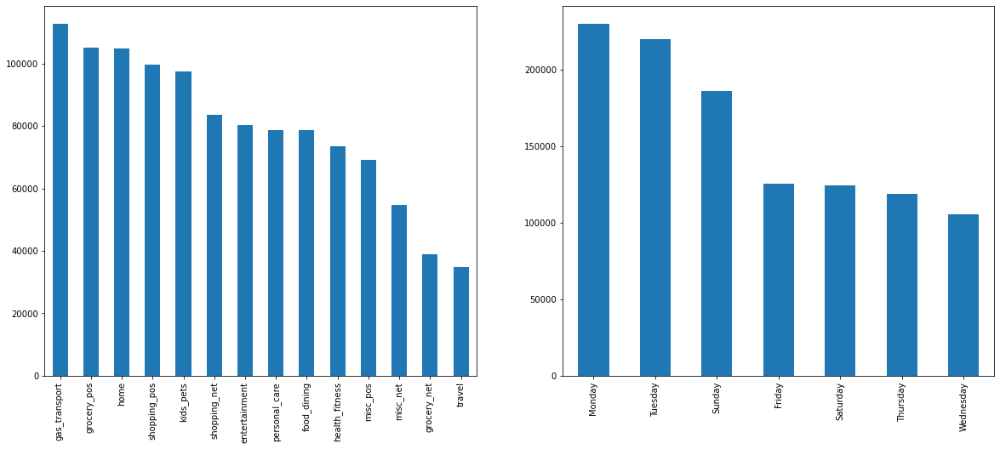

In [15]:
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
df['category'].value_counts().plot.bar();
plt.subplot(1,2,2)
df['day_of_week'].value_counts().plot.bar();


Sunday and Monday of the week have highest credit card transactions

In [16]:
df.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,trans_hour,day_of_week,year_month
0,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.860000,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.965900,-80.935500,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0,12,Sunday,2020-06
1,2020-06-21 12:14:33,3573030041201292,fraud_Sporer-Keebler,personal_care,29.840000,Joanne,Williams,F,3638 Marsh Union,Altonah,UT,84002,40.320700,-110.436000,302,"Sales professional, IT",1990-01-17,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0,12,Sunday,2020-06
2,2020-06-21 12:14:53,3598215285024754,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,41.280000,Ashley,Lopez,F,9333 Valentine Point,Bellmore,NY,11710,40.672900,-73.536500,34496,"Librarian, public",1970-10-21,c81755dbbbea9d5c77f094348a7579be,1371816893,40.495810,-74.196111,0,12,Sunday,2020-06
3,2020-06-21 12:15:15,3591919803438423,fraud_Haley Group,misc_pos,60.050000,Brian,Williams,M,32941 Krystal Mill Apt. 552,Titusville,FL,32780,28.569700,-80.819100,54767,Set designer,1987-07-25,2159175b9efe66dc301f149d3d5abf8c,1371816915,28.812398,-80.883061,0,12,Sunday,2020-06
4,2020-06-21 12:15:17,3526826139003047,fraud_Johnston-Casper,travel,3.190000,Nathan,Massey,M,5783 Evan Roads Apt. 465,Falmouth,MI,49632,44.252900,-85.017000,1126,Furniture designer,1955-07-06,57ff021bd3f328f8738bb535c302a31b,1371816917,44.959148,-85.884734,0,12,Sunday,2020-06


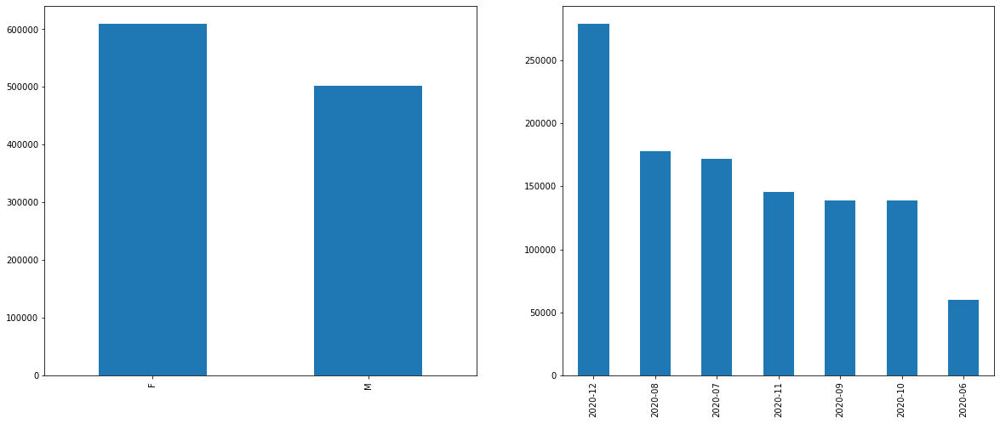

In [17]:
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
df['gender'].value_counts().plot.bar();
plt.subplot(1,2,2)
df['year_month'].value_counts().plot.bar();


Highest number of Transactions are in month of December

Lowest number of Transactions happens in February 


In [18]:
df.state.value_counts(normalize=True)

TX   0.072686
NY   0.064633
PA   0.061769
CA   0.043430
OH   0.036254
MI   0.035397
IL   0.034118
FL   0.032578
AL   0.031548
MO   0.029693
MN   0.024687
AR   0.024264
NC   0.023156
SC   0.022567
VA   0.022504
KY   0.022504
WI   0.022259
IN   0.021520
IA   0.021268
OK   0.020476
GA   0.020293
MD   0.020068
WV   0.019503
NJ   0.018945
NE   0.018457
KS   0.017892
LA   0.016174
MS   0.015895
WY   0.015213
WA   0.014605
OR   0.014056
TN   0.013242
NM   0.012632
ME   0.012467
ND   0.011511
CO   0.010592
SD   0.009447
MA   0.009332
MT   0.009091
VT   0.009077
UT   0.008382
AZ   0.008263
NH   0.006206
CT   0.005897
ID   0.004481
NV   0.004411
DC   0.002730
HI   0.001961
AK   0.001517
RI   0.000351
Name: state, dtype: float64

In [19]:
df.job.value_counts(normalize=True,ascending=False)

Film/video editor                                             0.007412
Exhibition designer                                           0.007140
Surveyor, land/geomatics                                      0.006759
Naval architect                                               0.006748
Designer, ceramics/pottery                                    0.006232
Materials engineer                                            0.006192
Environmental consultant                                      0.006167
Financial adviser                                             0.005945
IT trainer                                                    0.005873
Systems developer                                             0.005870
Copywriter, advertising                                       0.005569
Scientist, audiological                                       0.005506
Chief Executive Officer                                       0.005447
Chartered public finance accountant                           0.005400
Magazi

##### Derive Age of the Customer: 

````
Age of Customer = Trasaction Date - DOB
````

In [20]:
df['dob'] = pd.to_datetime(df['dob'])

In [21]:
df['age'] = np.round((df['trans_date_trans_time'] - df['dob'])/np.timedelta64(1,'Y'))
df['age']

0        52.000000
1        30.000000
2        50.000000
3        33.000000
4        65.000000
            ...   
555714   55.000000
555715   21.000000
555716   39.000000
555717   55.000000
555718   28.000000
Name: age, Length: 1111438, dtype: float64

In [22]:
df['age'].describe()

count   1111438.000000
mean         46.887567
std          17.434165
min          15.000000
25%          33.000000
50%          45.000000
75%          58.000000
max          96.000000
Name: age, dtype: float64

33-57 age people are 50% of our customers

Minimum age of customer is 14 

Maximum age of customer is 96

##### Distribution of amt

In [23]:
pd.concat(
[df['amt'].describe(percentiles = [0.5,0.95,0.999])\
.reset_index().rename(columns={'index': 'Row Type', 'amt':'Overall Amt Distribution'}),
df.loc[df['is_fraud']==0,['amt']].describe(percentiles = [0.5,0.95,0.999])\
.reset_index(drop = 1).rename(columns={'amt':'Non Fraud Amt Distribution'}),
df.loc[df['is_fraud']==1,['amt']].describe(percentiles = [0.5,0.95,0.999])\
.reset_index(drop = 1).rename(columns={'amt':'Fraud Amt Distribution'})],
axis=1
)

,Row Type,Overall Amt Distribution,Non Fraud Amt Distribution,Fraud Amt Distribution
0,count,1111438.000000,1107148.000000,4290.000000
1,mean,69.392810,67.614408,528.356494
2,std,156.745871,152.471862,392.701806
3,min,1.000000,1.000000,1.780000
4,50%,47.290000,47.150000,371.940000
5,95%,193.051500,188.870000,1084.290000
6,99.9%,1573.215250,1577.067800,1318.890000
7,max,22768.110000,22768.110000,1320.920000


Fraud Transaction mean is way higher than non-fraud transaction

Mean of Non Fraud Transactions: 67.6

Mean of Fraud Transactions: 530.6

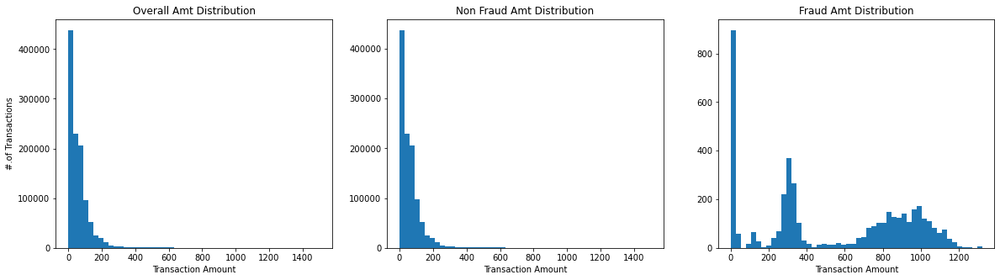

In [24]:
fig, ax = plt.subplots(1,3,figsize=(20,5))
ax[0].hist(df[df['amt']<=1500]['amt'], bins=50)
ax[1].hist(df[(df['is_fraud']==0) & (df['amt']<=1500)]['amt'], bins=50)
ax[2].hist(df[(df['is_fraud']==1) & (df['amt']<=1500)]['amt'], bins=50)

ax[0].set_title('Overall Amt Distribution')
ax[1].set_title('Non Fraud Amt Distribution')
ax[2].set_title('Fraud Amt Distribution')

ax[0].set_xlabel('Transaction Amount')
ax[0].set_ylabel('#.of Transactions')

ax[1].set_xlabel('Transaction Amount')
ax[2].set_xlabel('Transaction Amount')
plt.show()

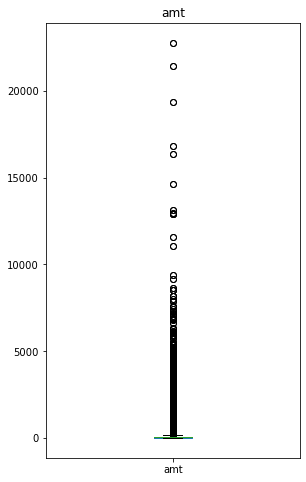

In [25]:
num_cols=['amt']
plt.figure(figsize=[10,8])
for ind, col in enumerate(num_cols):
    plt.subplot(1,2,ind+1)
    df[col].plot.box()
    plt.title(col)
plt.show()

### Timeline Plots

#### Year Month vs Number of Transactions

In [26]:
df_timeline01 = df.groupby(df['year_month'])[['trans_num','cc_num']].nunique().reset_index()
df_timeline01.columns = ['year_month','num_of_transactions','customers']
df_timeline01

,year_month,num_of_transactions,customers
0,2020-06,30058,909
1,2020-07,85848,911
2,2020-08,88759,908
3,2020-09,69533,914
4,2020-10,69348,913
5,2020-11,72635,909
6,2020-12,139538,910


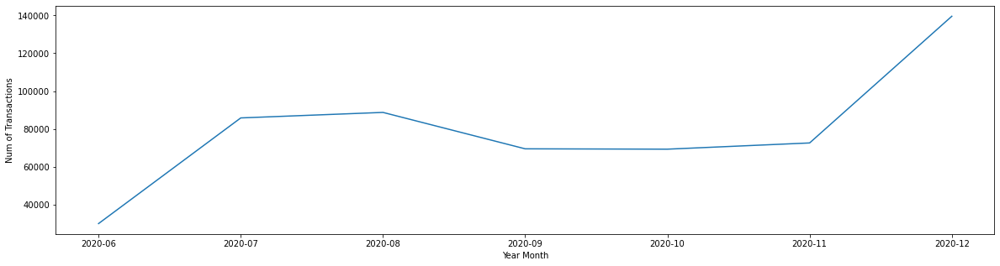

In [27]:
x = np.arange(0,len(df_timeline01),1)

fig, ax = plt.subplots(1,1,figsize=(20,5))
ax.plot(x,df_timeline01['num_of_transactions'])
ax.set_xticks(x)
ax.set_xticklabels(df_timeline01['year_month'])

ax.set_xlabel('Year Month')
ax.set_ylabel('Num of Transactions')
plt.show()


#### Year Month vs Number of Customers Done the Transactions

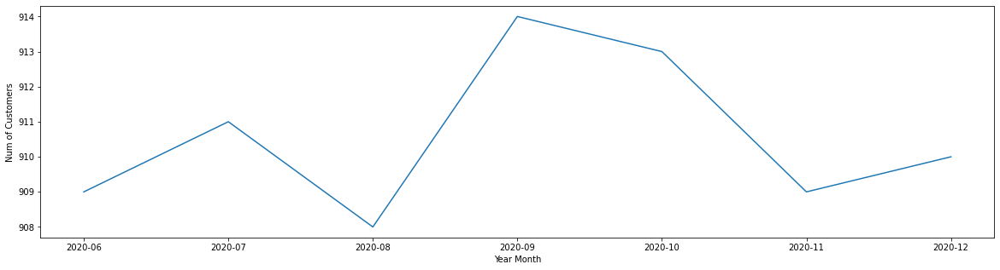

In [28]:
x = np.arange(0,len(df_timeline01),1)

fig, ax = plt.subplots(1,1,figsize=(20,5))
ax.plot(x,df_timeline01['customers'])
ax.set_xticks(x)
ax.set_xticklabels(df_timeline01['year_month'])

ax.set_xlabel('Year Month')
ax.set_ylabel('Num of Customers')
plt.show()


##### FRAUD Transactions

In [29]:
df_fraud_transactions = df[df['is_fraud']==1]

df_timeline02 = df_fraud_transactions.groupby(df_fraud_transactions['year_month'])[['trans_num','cc_num']].nunique().reset_index()
df_timeline02.columns = ['year_month','num_of_fraud_transactions','fraud_customers']
df_timeline02

,year_month,num_of_fraud_transactions,fraud_customers
0,2020-06,133,15
1,2020-07,321,35
2,2020-08,415,41
3,2020-09,340,35
4,2020-10,384,39
5,2020-11,294,31
6,2020-12,258,26


In [30]:
print(df_timeline02['num_of_fraud_transactions'].mean())

306.42857142857144


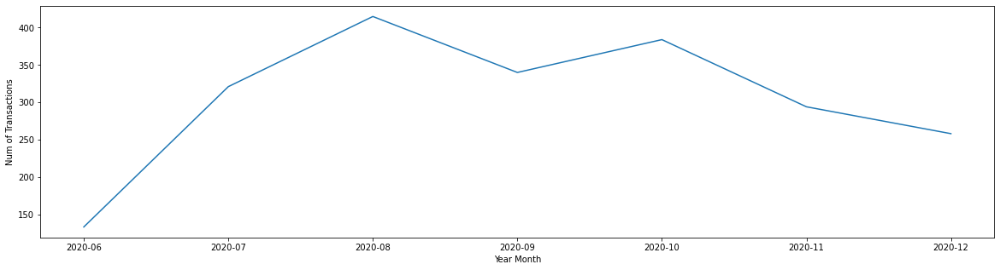

In [31]:
x = np.arange(0,len(df_timeline02),1)

fig, ax = plt.subplots(1,1,figsize=(20,5))
ax.plot(x,df_timeline02['num_of_fraud_transactions'])
ax.set_xticks(x)
ax.set_xticklabels(df_timeline02['year_month'])

ax.set_xlabel('Year Month')
ax.set_ylabel('Num of Transactions')
plt.show()

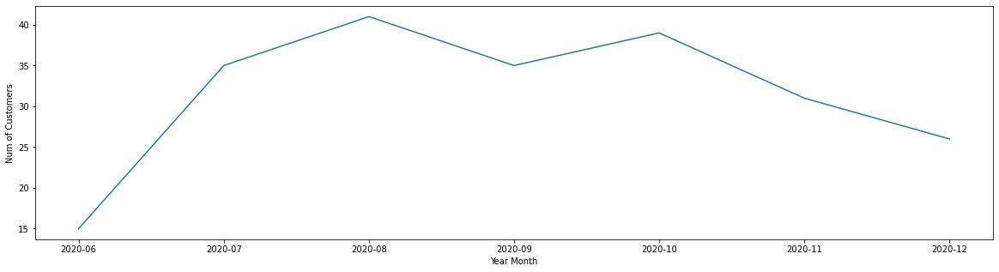

In [32]:
x = np.arange(0,len(df_timeline02),1)

fig, ax = plt.subplots(1,1,figsize=(20,5))
ax.plot(x,df_timeline02['fraud_customers'])
ax.set_xticks(x)
ax.set_xticklabels(df_timeline02['year_month'])

ax.set_xlabel('Year Month')
ax.set_ylabel('Num of Customers')
plt.show()

#### Gender

In [33]:
df_gender = df[['gender','trans_num']].groupby(['gender']).count().reset_index()
df_gender.columns = ['Gender','gender_count']

df_gender['percent'] = (df_gender['gender_count']/df_gender['gender_count'].sum())*100

df_gender

,Gender,gender_count,percent
0,F,609772,54.863339
1,M,501666,45.136661


Females customers are higher than male

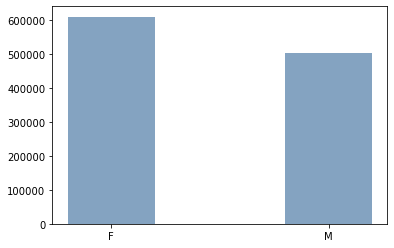

In [34]:
plt.bar(df_gender['Gender'], df_gender['gender_count'], color=(0.2, 0.4, 0.6, 0.6),  
        width = 0.4)

plt.show()

In [35]:
df_fraud_gender = df[['gender','is_fraud','trans_num']].groupby(['gender','is_fraud']).count().reset_index()
df_fraud_gender.columns = ['Gender','is_fraud','count']

df_fraud_gender = df_fraud_gender.merge(df_gender[['Gender','gender_count']],how='inner',\
                                  left_on='Gender',right_on='Gender')


df_fraud_gender['percent_grp'] = (df_fraud_gender['count']/df_fraud_gender['gender_count'])*100


df_fraud_gender

,Gender,is_fraud,count,gender_count,percent_grp
0,F,0,607444,609772,99.618218
1,F,1,2328,609772,0.381782
2,M,0,499704,501666,99.608903
3,M,1,1962,501666,0.391097


##### Category

In [36]:
df_category = df[['category','trans_num']].groupby(['category']).count().reset_index()
df_category.columns = ['Category','category_count']

df_category['percent'] = (df_category['category_count']/df_category['category_count'].sum())*100

df_category.sort_values(by = ['percent'], ascending=False)

,Category,category_count,percent
2,gas_transport,112740,10.143616
4,grocery_pos,105106,9.456758
6,home,104690,9.419329
12,shopping_pos,99582,8.959744
7,kids_pets,97384,8.761982
11,shopping_net,83558,7.518008
0,entertainment,80208,7.216597
10,personal_care,78654,7.076778
1,food_dining,78536,7.066161
5,health_fitness,73348,6.599378


gas_transport holds for 10% of the transactions 

In [37]:
df_category = df_category.sort_values(by = ['percent'], ascending=False).reset_index()
df_category

,index,Category,category_count,percent
0,2,gas_transport,112740,10.143616
1,4,grocery_pos,105106,9.456758
2,6,home,104690,9.419329
3,12,shopping_pos,99582,8.959744
4,7,kids_pets,97384,8.761982
5,11,shopping_net,83558,7.518008
6,0,entertainment,80208,7.216597
7,10,personal_care,78654,7.076778
8,1,food_dining,78536,7.066161
9,5,health_fitness,73348,6.599378


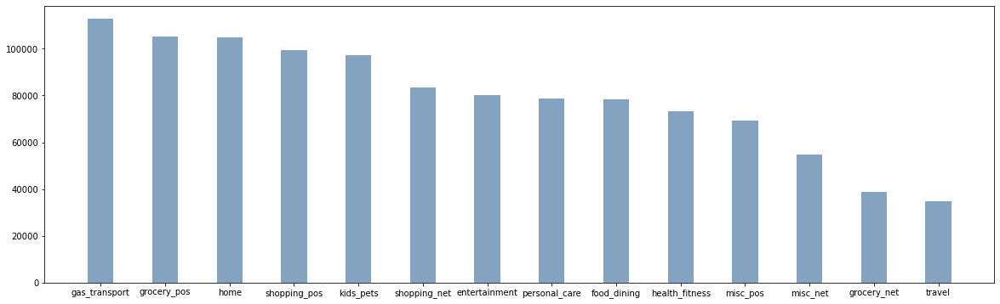

In [38]:
fig = plt.figure(figsize = (20, 6)) 


plt.bar(df_category['Category'], df_category['category_count'], color=(0.2, 0.4, 0.6, 0.6),  
        width = 0.4)

plt.show()

In [39]:
df_fraud_category = df[['category','is_fraud','trans_num']].groupby(['category','is_fraud']).count().reset_index()
df_fraud_category.columns = ['Category','is_fraud','count']

df_fraud_category = df_fraud_category.merge(df_category[['Category','category_count','percent']],how='inner',\
                                  left_on='Category',right_on='Category')


df_fraud_category['percent_grp'] = (df_fraud_category['count']/df_fraud_category['category_count'])*100


In [40]:
df_fraud_category.sort_values(by = ['category_count'], ascending=False)

,Category,is_fraud,count,category_count,percent,percent_grp
4,gas_transport,0,112432,112740,10.143616,99.726805
5,gas_transport,1,308,112740,10.143616,0.273195
8,grocery_pos,0,104136,105106,9.456758,99.077122
9,grocery_pos,1,970,105106,9.456758,0.922878
13,home,1,134,104690,9.419329,0.127997
12,home,0,104556,104690,9.419329,99.872003
25,shopping_pos,1,426,99582,8.959744,0.427788
24,shopping_pos,0,99156,99582,8.959744,99.572212
14,kids_pets,0,97254,97384,8.761982,99.866508
15,kids_pets,1,130,97384,8.761982,0.133492


grocery_pos and shopping_net has more number of fraud transactions compared to other categories

In [41]:
df_fraud=df_fraud_category[df_fraud_category['is_fraud'] == 1].sort_values(by = ['percent_grp'])
df_fraud

,Category,is_fraud,count,category_count,percent,percent_grp
13,home,1,134,104690,9.419329,0.127997
15,kids_pets,1,130,97384,8.761982,0.133492
3,food_dining,1,108,78536,7.066161,0.137517
11,health_fitness,1,104,73348,6.599378,0.141790
1,entertainment,1,118,80208,7.216597,0.147117
21,personal_care,1,140,78654,7.076778,0.177995
19,misc_pos,1,144,69148,6.221490,0.208249
7,grocery_net,1,82,38852,3.495652,0.211057
27,travel,1,80,34898,3.139896,0.229239
5,gas_transport,1,308,112740,10.143616,0.273195


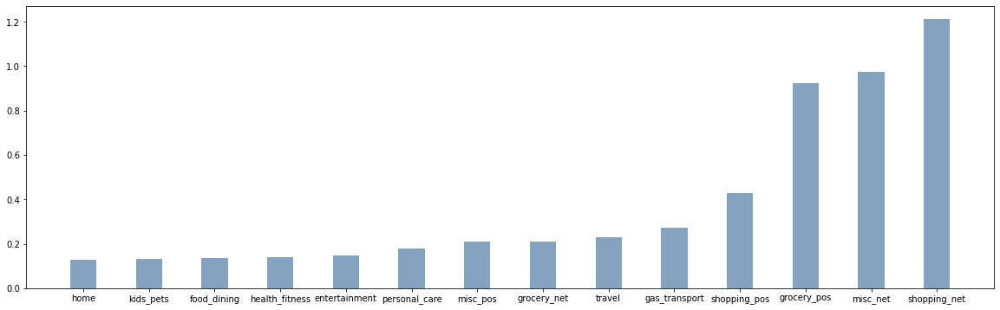

In [42]:
fig = plt.figure(figsize = (20, 6)) 


plt.bar(df_fraud['Category'] , df_fraud['percent_grp'], color=(0.2, 0.4, 0.6, 0.6),  
        width = 0.4)

plt.show()

##### Merchant

In [43]:
df.merchant.value_counts(normalize=True, ascending=False)

fraud_Kilback LLC                             0.003345
fraud_Cormier LLC                             0.002874
fraud_Schumm PLC                              0.002809
fraud_Kuhn LLC                                0.002737
fraud_Dickinson Ltd                           0.002733
fraud_Boyer PLC                               0.002710
fraud_Emard Inc                               0.002206
fraud_Parisian and Sons                       0.002163
fraud_Corwin-Collins                          0.002120
fraud_Streich, Hansen and Veum                0.002102
fraud_Robel, Cummerata and Prosacco           0.002096
fraud_Schaefer, McGlynn and Bosco             0.002093
fraud_Zieme, Bode and Dooley                  0.002087
fraud_Huels-Hahn                              0.002082
fraud_Kling Inc                               0.002077
fraud_Raynor, Feest and Miller                0.002073
fraud_Reilly, Heaney and Cole                 0.002064
fraud_Ledner-Pfannerstill                     0.002060
fraud_Koss

In [44]:
df_merchant = df[['merchant','trans_num']].groupby(['merchant']).count().reset_index()
df_merchant.columns = ['Merchant','merchant_count']

df_merchant['percent'] = (df_merchant['merchant_count']/df_merchant['merchant_count'].sum())*100

df_merchant.sort_values(by = ['percent'], ascending=False)

,Merchant,merchant_count,percent
316,fraud_Kilback LLC,3718,0.334522
105,fraud_Cormier LLC,3194,0.287375
571,fraud_Schumm PLC,3122,0.280897
349,fraud_Kuhn LLC,3042,0.273699
136,fraud_Dickinson Ltd,3038,0.273340
70,fraud_Boyer PLC,3012,0.271000
157,fraud_Emard Inc,2452,0.220615
474,fraud_Parisian and Sons,2404,0.216296
107,fraud_Corwin-Collins,2356,0.211978
605,"fraud_Streich, Hansen and Veum",2336,0.210178


In [45]:
df_fraud_merchant = df[['merchant','is_fraud','trans_num']].groupby(['merchant','is_fraud']).count().reset_index()
df_fraud_merchant.columns = ['Merchant','is_fraud','count']

df_fraud_merchant = df_fraud_merchant.merge(df_merchant[['Merchant','merchant_count','percent']],how='inner',\
                                  left_on='Merchant',right_on='Merchant')


df_fraud_merchant['percent_grp'] = (df_fraud_merchant['count']/df_fraud_merchant['merchant_count'])*100

In [46]:
df_fraud_merchant[df_fraud_merchant['is_fraud'] == 1].sort_values(by = ['percent_grp'],ascending=False)

,Merchant,is_fraud,count,merchant_count,percent,percent_grp
957,"fraud_Romaguera, Cruickshank and Greenholt",1,36,1656,0.148996,2.173913
703,fraud_Lemke-Gutmann,1,36,1674,0.150616,2.150538
805,"fraud_Mosciski, Ziemann and Farrell",1,36,1740,0.156554,2.068966
439,"fraud_Heathcote, Yost and Kertzmann",1,34,1660,0.149356,2.048193
947,"fraud_Rodriguez, Yost and Jenkins",1,20,1002,0.090153,1.996008
767,fraud_Medhurst PLC,1,30,1544,0.138919,1.943005
51,fraud_Bashirian Group,1,30,1580,0.142158,1.898734
627,fraud_Kris-Weimann,1,20,1056,0.095012,1.893939
437,fraud_Heathcote LLC,1,30,1604,0.144318,1.870324
68,fraud_Bednar Group,1,20,1080,0.097171,1.851852


##### One Hot-Encoding

In [47]:
category_onehot = pd.get_dummies(df.category, prefix='category', drop_first=True)
gender_onehot = pd.get_dummies(df.gender, prefix='gender', drop_first=True)
day_of_week_onehot = pd.get_dummies(df.day_of_week, prefix='week',drop_first=True)

In [48]:
df1 = pd.concat([df, category_onehot,gender_onehot,day_of_week_onehot], axis=1)

In [49]:
df1.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,trans_hour,day_of_week,year_month,age,category_food_dining,category_gas_transport,category_grocery_net,category_grocery_pos,category_health_fitness,category_home,category_kids_pets,category_misc_net,category_misc_pos,category_personal_care,category_shopping_net,category_shopping_pos,category_travel,gender_M,week_Monday,week_Saturday,week_Sunday,week_Thursday,week_Tuesday,week_Wednesday
0,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.860000,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.965900,-80.935500,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0,12,Sunday,2020-06,52.000000,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0
1,2020-06-21 12:14:33,3573030041201292,fraud_Sporer-Keebler,personal_care,29.840000,Joanne,Williams,F,3638 Marsh Union,Altonah,UT,84002,40.320700,-110.436000,302,"Sales professional, IT",1990-01-17,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0,12,Sunday,2020-06,30.000000,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
2,2020-06-21 12:14:53,3598215285024754,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,41.280000,Ashley,Lopez,F,9333 Valentine Point,Bellmore,NY,11710,40.672900,-73.536500,34496,"Librarian, public",1970-10-21,c81755dbbbea9d5c77f094348a7579be,1371816893,40.495810,-74.196111,0,12,Sunday,2020-06,50.000000,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
3,2020-06-21 12:15:15,3591919803438423,fraud_Haley Group,misc_pos,60.050000,Brian,Williams,M,32941 Krystal Mill Apt. 552,Titusville,FL,32780,28.569700,-80.819100,54767,Set designer,1987-07-25,2159175b9efe66dc301f149d3d5abf8c,1371816915,28.812398,-80.883061,0,12,Sunday,2020-06,33.000000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0
4,2020-06-21 12:15:17,3526826139003047,fraud_Johnston-Casper,travel,3.190000,Nathan,Massey,M,5783 Evan Roads Apt. 465,Falmouth,MI,49632,44.252900,-85.017000,1126,Furniture designer,1955-07-06,57ff021bd3f328f8738bb535c302a31b,1371816917,44.959148,-85.884734,0,12,Sunday,2020-06,65.000000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0


In [50]:
def haversine(lat1, lon1, lat2, lon2, to_radians=True, earth_radius=6371):
    """
    Calculate the great circle distance between two points
    on the earth (specified in decimal degrees or in radians)

    All (lat, lon) coordinates must have numeric dtypes and be of equal length.

    """
    if to_radians:
        lat1, lon1, lat2, lon2 = np.radians([lat1, lon1, lat2, lon2])

    a = np.sin((lat2-lat1)/2.0)**2 + \
        np.cos(lat1) * np.cos(lat2) * np.sin((lon2-lon1)/2.0)**2

    return earth_radius * 2 * np.arcsin(np.sqrt(a))

In [51]:
df1['dist'] = \
    haversine(df1['lat'], df1['long'],
                 df1['merch_lat'], df1['merch_long'])

In [52]:
df1['dist'].describe()

count   1111438.000000
mean         76.104902
std          29.117066
min           0.123883
25%          55.286175
50%          78.179517
75%          98.520813
max         150.922504
Name: dist, dtype: float64

In [53]:
df1.dtypes

trans_date_trans_time      datetime64[ns]
cc_num                              int64
merchant                           object
category                           object
amt                               float64
first                              object
last                               object
gender                             object
street                             object
city                               object
state                              object
zip                                 int64
lat                               float64
long                              float64
city_pop                            int64
job                                object
dob                        datetime64[ns]
trans_num                          object
unix_time                           int64
merch_lat                         float64
merch_long                        float64
is_fraud                            int64
trans_hour                          int64
day_of_week                       

In [54]:
df1.columns

Index(['trans_date_trans_time', 'cc_num', 'merchant', 'category', 'amt',
       'first', 'last', 'gender', 'street', 'city', 'state', 'zip', 'lat',
       'long', 'city_pop', 'job', 'dob', 'trans_num', 'unix_time', 'merch_lat',
       'merch_long', 'is_fraud', 'trans_hour', 'day_of_week', 'year_month',
       'age', 'category_food_dining', 'category_gas_transport',
       'category_grocery_net', 'category_grocery_pos',
       'category_health_fitness', 'category_home', 'category_kids_pets',
       'category_misc_net', 'category_misc_pos', 'category_personal_care',
       'category_shopping_net', 'category_shopping_pos', 'category_travel',
       'gender_M', 'week_Monday', 'week_Saturday', 'week_Sunday',
       'week_Thursday', 'week_Tuesday', 'week_Wednesday', 'dist'],
      dtype='object')

##### Historic Variables

In [55]:
df1.index = pd.to_datetime(df1['trans_date_trans_time'])
df1 = df1.rename_axis(index={'trans_date_trans_time': 'time_index'})
df1 = df1.sort_index()
df1.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,trans_hour,day_of_week,year_month,age,category_food_dining,category_gas_transport,category_grocery_net,category_grocery_pos,category_health_fitness,category_home,category_kids_pets,category_misc_net,category_misc_pos,category_personal_care,category_shopping_net,category_shopping_pos,category_travel,gender_M,week_Monday,week_Saturday,week_Sunday,week_Thursday,week_Tuesday,week_Wednesday,dist
time_index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-06-21 12:14:25,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.860000,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.965900,-80.935500,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0,12,Sunday,2020-06,52.000000,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,24.561462
2020-06-21 12:14:25,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.860000,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.965900,-80.935500,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0,12,Sunday,2020-06,52.000000,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,24.561462
2020-06-21 12:14:33,2020-06-21 12:14:33,3573030041201292,fraud_Sporer-Keebler,personal_care,29.840000,Joanne,Williams,F,3638 Marsh Union,Altonah,UT,84002,40.320700,-110.436000,302,"Sales professional, IT",1990-01-17,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0,12,Sunday,2020-06,30.000000,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,104.925092
2020-06-21 12:14:33,2020-06-21 12:14:33,3573030041201292,fraud_Sporer-Keebler,personal_care,29.840000,Joanne,Williams,F,3638 Marsh Union,Altonah,UT,84002,40.320700,-110.436000,302,"Sales professional, IT",1990-01-17,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0,12,Sunday,2020-06,30.000000,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,104.925092
2020-06-21 12:14:53,2020-06-21 12:14:53,3598215285024754,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,41.280000,Ashley,Lopez,F,9333 Valentine Point,Bellmore,NY,11710,40.672900,-73.536500,34496,"Librarian, public",1970-10-21,c81755dbbbea9d5c77f094348a7579be,1371816893,40.495810,-74.196111,0,12,Sunday,2020-06,50.000000,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,59.080078


In [56]:
df1['val_for_agg'] = 1

##### 60 days transactions by customer

In [57]:
df_hist_trans_60d = \
    df1 \
    .groupby(['cc_num'])['val_for_agg']\
    .rolling('60D')\
    .count()\
    .shift()\
    .reset_index()\
    .fillna(0)

df_hist_trans_60d.columns = ['cc_num','trans_date','hist_trans_60d']

In [58]:
df_hist_trans_60d['trans_date'] = df_hist_trans_60d['trans_date'].dt.date

In [59]:
df_hist_trans_60d = df_hist_trans_60d.groupby(['cc_num','trans_date'])['hist_trans_60d'].min().reset_index()

In [60]:
df_hist_trans_60d.head()

,cc_num,trans_date,hist_trans_60d
0,60416207185,2020-06-21,0.000000
1,60416207185,2020-06-22,4.000000
2,60416207185,2020-06-23,8.000000
3,60416207185,2020-06-24,18.000000
4,60416207185,2020-06-25,24.000000


##### 24 hours order by customer

In [61]:
df_hist_orders_24h = \
    df1 \
    .groupby(['cc_num'])['val_for_agg']\
    .rolling('24H')\
    .count()\
    .shift()\
    .reset_index()\
    .fillna(0)

df_hist_orders_24h.columns = ['cc_num','trans_date_trans_time','hist_trans_24h']

In [62]:
df_hist_orders_24h.head()

,cc_num,trans_date_trans_time,hist_trans_24h
0,60416207185,2020-06-21 13:05:42,0.000000
1,60416207185,2020-06-21 13:05:42,1.000000
2,60416207185,2020-06-21 16:25:36,2.000000
3,60416207185,2020-06-21 16:25:36,3.000000
4,60416207185,2020-06-22 07:58:33,4.000000


##### 24 hrs fraud historic transactions

In [63]:
df_hist_fraud_trans_24h = \
    df1[df1['is_fraud']== 1]\
    .groupby(['cc_num'])['val_for_agg']\
    .rolling('24H')\
    .count()\
    .shift()\
    .reset_index()\
    .fillna(0)

df_hist_fraud_trans_24h.columns = ['cc_num','trans_date_trans_time','hist_fraud_trans_24h']

In [64]:
df_hist_fraud_trans_24h.head()

,cc_num,trans_date_trans_time,hist_fraud_trans_24h
0,60487002085,2020-09-22 01:11:51,0.000000
1,60487002085,2020-09-22 01:11:51,1.000000
2,60487002085,2020-09-22 02:02:46,2.000000
3,60487002085,2020-09-22 02:02:46,3.000000
4,60487002085,2020-09-22 22:39:18,4.000000


#### 2 Hours Fraud by Customers

In [65]:
df_hist_fraud_trans_2h = \
    df1[df1['is_fraud']== 1]\
    .groupby(['cc_num'])['val_for_agg']\
    .rolling('2H')\
    .count()\
    .shift()\
    .reset_index()\
    .fillna(0)

df_hist_fraud_trans_2h.columns = ['cc_num','trans_date_trans_time','hist_fraud_trans_2h']

In [66]:
df_hist_fraud_trans_2h.head()

,cc_num,trans_date_trans_time,hist_fraud_trans_2h
0,60487002085,2020-09-22 01:11:51,0.000000
1,60487002085,2020-09-22 01:11:51,1.000000
2,60487002085,2020-09-22 02:02:46,2.000000
3,60487002085,2020-09-22 02:02:46,3.000000
4,60487002085,2020-09-22 22:39:18,4.000000


##### 60 Day Orders Amt Avg by Customers

In [67]:
df_hist_trans_amt_avg_60d = \
    df1 \
    .groupby(['cc_num'])['amt']\
    .rolling('60D')\
    .mean()\
    .shift(1)\
    .reset_index()\
    .fillna(0)

df_hist_trans_amt_avg_60d.columns = ['cc_num','trans_date','hist_trans_avg_amt_60d']

In [68]:
df_hist_trans_amt_avg_60d['trans_date'] = df_hist_trans_amt_avg_60d['trans_date'].dt.date

In [69]:
df_hist_trans_amt_avg_60d = df_hist_trans_amt_avg_60d.groupby(['cc_num','trans_date'])\
['hist_trans_avg_amt_60d'].min().reset_index()

In [70]:
df_hist_trans_amt_avg_60d.head(10)

,cc_num,trans_date,hist_trans_avg_amt_60d
0,60416207185,2020-06-21,0.000000
1,60416207185,2020-06-22,89.228571
2,60416207185,2020-06-23,61.546471
3,60416207185,2020-06-24,57.279000
4,60416207185,2020-06-25,57.823333
5,60416207185,2020-06-26,65.544286
6,60416207185,2020-06-27,64.977317
7,60416207185,2020-06-28,62.286744
8,60416207185,2020-06-29,57.584182
9,60416207185,2020-06-30,57.332143


###### Merge Historical Variables with Transactions by ['cc_num','trans_date_trans_time']

In [71]:
df1['trans_date'] = df1['trans_date_trans_time'].dt.date

In [72]:
df2 = df1.merge(df_hist_trans_60d,left_on = ['cc_num','trans_date'], \
          right_on = ['cc_num','trans_date'],how = 'left')

In [73]:
df2 = df2.merge(df_hist_orders_24h,left_on = ['cc_num','trans_date_trans_time'], \
          right_on = ['cc_num','trans_date_trans_time'],how = 'left')

df2 = df2.merge(df_hist_fraud_trans_24h,left_on = ['cc_num','trans_date_trans_time'], \
          right_on = ['cc_num','trans_date_trans_time'],how = 'left')

df2 = df2.merge(df_hist_fraud_trans_2h,left_on = ['cc_num','trans_date_trans_time'], \
          right_on = ['cc_num','trans_date_trans_time'],how = 'left')

df2 = df2.merge(df_hist_trans_amt_avg_60d,left_on = ['cc_num','trans_date'], \
          right_on = ['cc_num','trans_date'],how = 'left')

In [74]:
df2[['hist_trans_60d','hist_trans_24h','hist_fraud_trans_24h','hist_fraud_trans_2h','hist_trans_avg_amt_60d']]= \
df2[['hist_trans_60d','hist_trans_24h','hist_fraud_trans_24h','hist_fraud_trans_2h','hist_trans_avg_amt_60d']].fillna(0)

In [75]:
df2.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,trans_hour,day_of_week,year_month,age,category_food_dining,category_gas_transport,category_grocery_net,category_grocery_pos,category_health_fitness,category_home,category_kids_pets,category_misc_net,category_misc_pos,category_personal_care,category_shopping_net,category_shopping_pos,category_travel,gender_M,week_Monday,week_Saturday,week_Sunday,week_Thursday,week_Tuesday,week_Wednesday,dist,val_for_agg,trans_date,hist_trans_60d,hist_trans_24h,hist_fraud_trans_24h,hist_fraud_trans_2h,hist_trans_avg_amt_60d
0,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.860000,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.965900,-80.935500,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0,12,Sunday,2020-06,52.000000,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,24.561462,1,2020-06-21,1.000000,8.000000,0.000000,0.000000,2.860000
1,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.860000,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.965900,-80.935500,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0,12,Sunday,2020-06,52.000000,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,24.561462,1,2020-06-21,1.000000,1.000000,0.000000,0.000000,2.860000
2,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.860000,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.965900,-80.935500,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0,12,Sunday,2020-06,52.000000,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,24.561462,1,2020-06-21,1.000000,8.000000,0.000000,0.000000,2.860000
3,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.860000,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.965900,-80.935500,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0,12,Sunday,2020-06,52.000000,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,24.561462,1,2020-06-21,1.000000,1.000000,0.000000,0.000000,2.860000
4,2020-06-21 12:14:33,3573030041201292,fraud_Sporer-Keebler,personal_care,29.840000,Joanne,Williams,F,3638 Marsh Union,Altonah,UT,84002,40.320700,-110.436000,302,"Sales professional, IT",1990-01-17,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0,12,Sunday,2020-06,30.000000,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,104.925092,1,2020-06-21,1.000000,6.000000,0.000000,0.000000,19.555714


In [76]:
df2['hist_fraud_trans_24h'] = df2['hist_fraud_trans_24h'] - df2['hist_fraud_trans_2h']

In [77]:
cols = ['amt','city_pop', 'trans_hour',
       'age', 'category_food_dining', 'category_gas_transport',
       'category_grocery_net', 'category_grocery_pos',
       'category_health_fitness', 'category_home', 'category_kids_pets',
       'category_misc_net', 'category_misc_pos', 'category_personal_care',
       'category_shopping_net', 'category_shopping_pos', 'category_travel',
       'gender_M','week_Monday','week_Tuesday', 'week_Wednesday','week_Thursday',
        'week_Saturday', 'week_Sunday','dist','hist_trans_60d','hist_trans_24h',
       'hist_fraud_trans_24h','hist_trans_avg_amt_60d','is_fraud']

In [78]:
corr = df2[cols].corr()

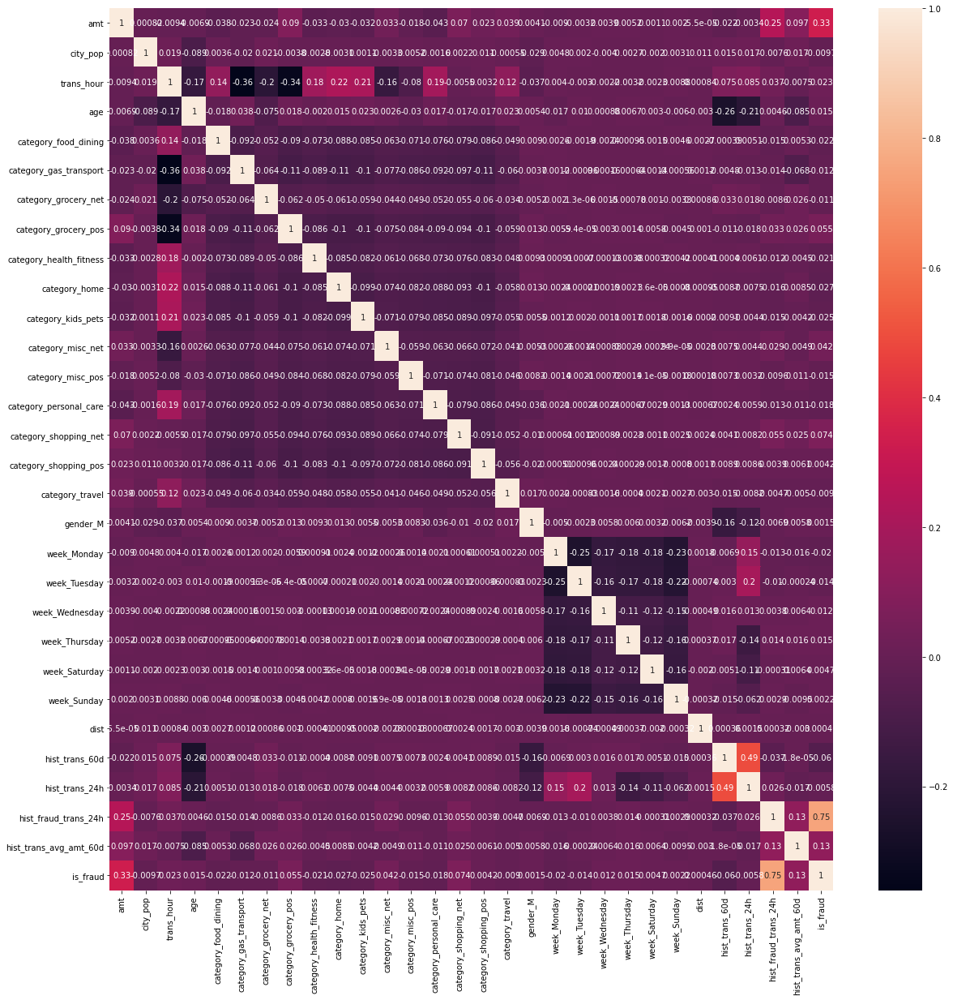

In [79]:
import seaborn as sn

fig, ax = plt.subplots(figsize=(20,20))
sn.heatmap(corr, annot=True)
plt.show()

hist_fraud_trans_24h is highly correlated with is_fraud - 0.77

hist_trans_24h is also correlated with hist_trans_60d   - 0.56

##### Data visualization with plotly

In [80]:
import plotly
import plotly.graph_objects as go 

In [81]:
df2.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,trans_hour,day_of_week,year_month,age,category_food_dining,category_gas_transport,category_grocery_net,category_grocery_pos,category_health_fitness,category_home,category_kids_pets,category_misc_net,category_misc_pos,category_personal_care,category_shopping_net,category_shopping_pos,category_travel,gender_M,week_Monday,week_Saturday,week_Sunday,week_Thursday,week_Tuesday,week_Wednesday,dist,val_for_agg,trans_date,hist_trans_60d,hist_trans_24h,hist_fraud_trans_24h,hist_fraud_trans_2h,hist_trans_avg_amt_60d
0,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.860000,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.965900,-80.935500,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0,12,Sunday,2020-06,52.000000,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,24.561462,1,2020-06-21,1.000000,8.000000,0.000000,0.000000,2.860000
1,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.860000,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.965900,-80.935500,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0,12,Sunday,2020-06,52.000000,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,24.561462,1,2020-06-21,1.000000,1.000000,0.000000,0.000000,2.860000
2,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.860000,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.965900,-80.935500,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0,12,Sunday,2020-06,52.000000,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,24.561462,1,2020-06-21,1.000000,8.000000,0.000000,0.000000,2.860000
3,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.860000,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.965900,-80.935500,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0,12,Sunday,2020-06,52.000000,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,24.561462,1,2020-06-21,1.000000,1.000000,0.000000,0.000000,2.860000
4,2020-06-21 12:14:33,3573030041201292,fraud_Sporer-Keebler,personal_care,29.840000,Joanne,Williams,F,3638 Marsh Union,Altonah,UT,84002,40.320700,-110.436000,302,"Sales professional, IT",1990-01-17,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0,12,Sunday,2020-06,30.000000,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,104.925092,1,2020-06-21,1.000000,6.000000,0.000000,0.000000,19.555714


In [82]:
df_fraud_merchant = df[['merchant','is_fraud','trans_num']].groupby(['merchant','is_fraud']).count().reset_index()
df_fraud_merchant.columns = ['Merchant','is_fraud','count']

df_fraud_merchant = df_fraud_merchant.merge(df_merchant[['Merchant','merchant_count','percent']],how='inner',\
                                  left_on='Merchant',right_on='Merchant')


df_fraud_merchant['percent_grp'] = (df_fraud_merchant['count']/df_fraud_merchant['merchant_count'])*100

In [83]:
df_job = df[['job','trans_num']].groupby(['job']).count().reset_index()
df_job.columns = ['Job','tran_count_by_job']

df_job['percent'] = (df_job['tran_count_by_job']/df_job['tran_count_by_job'].sum())*100

df_job.sort_values(by = ['percent'], ascending=False)

,Job,tran_count_by_job,percent
186,Film/video editor,8238,0.741202
180,Exhibition designer,7936,0.714030
425,"Surveyor, land/geomatics",7512,0.675881
296,Naval architect,7500,0.674801
114,"Designer, ceramics/pottery",6926,0.623157
274,Materials engineer,6882,0.619198
171,Environmental consultant,6854,0.616679
187,Financial adviser,6608,0.594545
230,IT trainer,6528,0.587347
430,Systems developer,6524,0.586987


In [84]:
df_fraud_job = df[['job','is_fraud','trans_num']].groupby(['job','is_fraud']).count().reset_index()
df_fraud_job.columns = ['Job','is_fraud','count']

df_fraud_job =  df_fraud_job.merge(df_job[['Job','tran_count_by_job','percent']],how='inner',\
                                  left_on='Job',right_on='Job')


df_fraud_job['percent_grp'] = (df_fraud_job['count']/df_fraud_job['tran_count_by_job'])*100

In [85]:
job_plt_data = df_fraud_job.sort_values(by = ["tran_count_by_job"], ascending = False).head(20)

In [86]:
job_plt_data

,Job,is_fraud,count,tran_count_by_job,percent,percent_grp
258,Film/video editor,1,16,8238,0.741202,0.194222
257,Film/video editor,0,8222,8238,0.741202,99.805778
251,Exhibition designer,0,7936,7936,0.714030,100.000000
576,"Surveyor, land/geomatics",0,7512,7512,0.675881,100.000000
403,Naval architect,1,26,7500,0.674801,0.346667
402,Naval architect,0,7474,7500,0.674801,99.653333
164,"Designer, ceramics/pottery",1,22,6926,0.623157,0.317644
163,"Designer, ceramics/pottery",0,6904,6926,0.623157,99.682356
377,Materials engineer,0,6882,6882,0.619198,100.000000
241,Environmental consultant,1,30,6854,0.616679,0.437701


In [87]:
job_plt_data['label'] = 'Not Fraud'
job_plt_data.loc[job_plt_data['is_fraud']==1,['label']]= 'Fraud'
job_plt_data

,Job,is_fraud,count,tran_count_by_job,percent,percent_grp,label
258,Film/video editor,1,16,8238,0.741202,0.194222,Fraud
257,Film/video editor,0,8222,8238,0.741202,99.805778,Not Fraud
251,Exhibition designer,0,7936,7936,0.714030,100.000000,Not Fraud
576,"Surveyor, land/geomatics",0,7512,7512,0.675881,100.000000,Not Fraud
403,Naval architect,1,26,7500,0.674801,0.346667,Fraud
402,Naval architect,0,7474,7500,0.674801,99.653333,Not Fraud
164,"Designer, ceramics/pottery",1,22,6926,0.623157,0.317644,Fraud
163,"Designer, ceramics/pottery",0,6904,6926,0.623157,99.682356,Not Fraud
377,Materials engineer,0,6882,6882,0.619198,100.000000,Not Fraud
241,Environmental consultant,1,30,6854,0.616679,0.437701,Fraud


In [88]:
ne_grp = job_plt_data['Job'].unique()
print(ne_grp)

rm_grp = job_plt_data['label'].unique()
print(rm_grp)

['Film/video editor' 'Exhibition designer' 'Surveyor, land/geomatics'
 'Naval architect' 'Designer, ceramics/pottery' 'Materials engineer'
 'Environmental consultant' 'Financial adviser' 'IT trainer'
 'Systems developer' 'Copywriter, advertising' 'Scientist, audiological']
['Fraud' 'Not Fraud']


In [89]:
fig = go.Figure(data=[
    go.Bar(name=rm_grp[0], x = ne_grp, y = job_plt_data[job_plt_data['label'] == rm_grp[0]]['percent_grp']),
    #go.Bar(name=rm_grp[1], x = ne_grp, y = job_plt_data[job_plt_data['label'] == rm_grp[1]]['percent_grp'])
])
# Change the bar mode
fig.update_layout(xaxis_title="JOb Group "\
                  ,yaxis_title="Fraud Percent of Listings")
fig.show()

##### Interactive Dashboard to Understand the Transaction Amt Distribution Based on City, Age and Gender

In [90]:
from ipywidgets import interact
fig = go.FigureWidget()
scatt = fig.add_histogram()

xs = df2
@interact(state = df2['state'].unique(), \
          gender = df2['gender'].unique(),\
          age = (14,100,5),
          is_fraud = [0,1])

def update(state = 'NC',gender = 'M', age = 14,is_fraud=1):
    with fig.batch_update():
        scatt = df2[(df2['state'] == state) \
                   & (df2['gender'] == gender) \
                   & (df2['age'] >= age) \
                   & (df2['is_fraud'] == is_fraud)]['amt']
        fig.data[0].x=scatt
fig.update_layout(xaxis_title="Number of transaction"
                  ,yaxis_title="Transaction amount")

interactive(children=(Dropdown(description='state', index=42, options=('SC', 'UT', 'NY', 'FL', 'MI', 'CA', 'SD…

FigureWidget({
    'data': [{'type': 'histogram',
              'uid': '4971a457-5e70-4128-8058-3b348b573877',…

In [91]:
fig

FigureWidget({
    'data': [{'type': 'histogram',
              'uid': '4971a457-5e70-4128-8058-3b348b573877',…

##### Ploting Fraudulent Transactions in the Map

In [92]:
dftemp_fraud = df2[df2['is_fraud'] == 1]
fig = go.Figure()
fig.add_trace(go.Scattergeo(
        locationmode = 'USA-states',
        lon = dftemp_fraud['long'],
        lat = dftemp_fraud['lat'],
        #text = df_sub['text'],
        marker = dict(
            #size = df_sub['total_cases']/scale,
            color = dftemp_fraud['is_fraud'],
            line_color='rgb(40,40,40)',
            line_width=0.5,
            sizemode = 'area'
        ),
        name = 'test'))
fig.update_layout( title_text = 'test',
                 geo = dict(
                     landcolor = 'rgb(217,217,217)',),
                  mapbox_style="open-street-map"
                 )

In [93]:
import plotly.express as px 

df2_fraud = df2[df2['is_fraud'] == 1]

fig = px.scatter_mapbox(df2_fraud, lat="lat", lon="long", hover_name="city",
                         zoom=3, height=500,
                         color="is_fraud",  color_discrete_sequence=px.colors.cyclical.IceFire)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

##### Test-Train Split

In [94]:
X_cols = ['amt','city_pop', 'trans_hour',
       'age', 'category_food_dining', 'category_gas_transport',
       'category_grocery_net', 'category_grocery_pos',
       'category_health_fitness', 'category_home', 'category_kids_pets',
       'category_misc_net', 'category_misc_pos', 'category_personal_care',
       'category_shopping_net', 'category_shopping_pos', 'category_travel',
       'gender_M','week_Monday','week_Tuesday', 'week_Wednesday','week_Thursday',
        'week_Saturday', 'week_Sunday','dist','hist_trans_60d','hist_trans_24h',
       'hist_fraud_trans_24h','hist_trans_avg_amt_60d'] #,

Y_cols = ['is_fraud']

In [95]:
#Importing Library
from sklearn.model_selection import train_test_split

##### Oversampling

In [96]:
#As this dataset is highly imbalance we have to balance this by over sampling
cnt_non_fraud = df2[df2['is_fraud'] == 0]['amt'].count()
df2_class_fraud = df2[df2['is_fraud'] == 1]
df2_class_nonfraud = df2[df2['is_fraud'] == 0]

In [97]:
#OverSampling
df2_class_fraud_oversample = df2_class_fraud.sample(cnt_non_fraud, replace=True)
df2_oversampled = pd.concat([df2_class_nonfraud, df2_class_fraud_oversample], axis=0)

print('Random over-sampling:')
print(df2_oversampled['is_fraud'].value_counts())

Random over-sampling:
1    2214488
0    2214488
Name: is_fraud, dtype: int64


In [98]:
df2_oversampled.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,trans_hour,day_of_week,year_month,age,category_food_dining,category_gas_transport,category_grocery_net,category_grocery_pos,category_health_fitness,category_home,category_kids_pets,category_misc_net,category_misc_pos,category_personal_care,category_shopping_net,category_shopping_pos,category_travel,gender_M,week_Monday,week_Saturday,week_Sunday,week_Thursday,week_Tuesday,week_Wednesday,dist,val_for_agg,trans_date,hist_trans_60d,hist_trans_24h,hist_fraud_trans_24h,hist_fraud_trans_2h,hist_trans_avg_amt_60d
0,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.860000,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.965900,-80.935500,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0,12,Sunday,2020-06,52.000000,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,24.561462,1,2020-06-21,1.000000,8.000000,0.000000,0.000000,2.860000
1,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.860000,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.965900,-80.935500,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0,12,Sunday,2020-06,52.000000,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,24.561462,1,2020-06-21,1.000000,1.000000,0.000000,0.000000,2.860000
2,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.860000,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.965900,-80.935500,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0,12,Sunday,2020-06,52.000000,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,24.561462,1,2020-06-21,1.000000,8.000000,0.000000,0.000000,2.860000
3,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.860000,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.965900,-80.935500,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0,12,Sunday,2020-06,52.000000,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,24.561462,1,2020-06-21,1.000000,1.000000,0.000000,0.000000,2.860000
4,2020-06-21 12:14:33,3573030041201292,fraud_Sporer-Keebler,personal_care,29.840000,Joanne,Williams,F,3638 Marsh Union,Altonah,UT,84002,40.320700,-110.436000,302,"Sales professional, IT",1990-01-17,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0,12,Sunday,2020-06,30.000000,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,104.925092,1,2020-06-21,1.000000,6.000000,0.000000,0.000000,19.555714


####  Train and test split

In [99]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(df2_oversampled[X_cols],df2_oversampled[Y_cols] , train_size=0.7, test_size=0.3, random_state=42)

In [100]:
X_train.shape

(3100283, 29)

In [101]:
X_test.shape

(1328693, 29)

#### Logistic Regression

In [102]:
#Importing Library
from sklearn.linear_model import LogisticRegression

In [103]:
logreg = LogisticRegression(random_state=42)

In [104]:
#Building Logistic Regression  Model
logreg.fit(X_train, y_train)

LogisticRegression(random_state=42)

In [105]:
y_train_pred = logreg.predict(X_train)
y_test_pred = logreg.predict(X_test)

In [106]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [107]:
print(confusion_matrix(y_train, y_train_pred))
print(classification_report(y_train, y_train_pred))

[[1451347   99190]
 [ 363222 1186524]]
              precision    recall  f1-score   support

           0       0.80      0.94      0.86   1550537
           1       0.92      0.77      0.84   1549746

    accuracy                           0.85   3100283
   macro avg       0.86      0.85      0.85   3100283
weighted avg       0.86      0.85      0.85   3100283



In [108]:
print(confusion_matrix(y_test, y_test_pred))
print(classification_report(y_test, y_test_pred))

[[621335  42616]
 [156020 508722]]
              precision    recall  f1-score   support

           0       0.80      0.94      0.86    663951
           1       0.92      0.77      0.84    664742

    accuracy                           0.85   1328693
   macro avg       0.86      0.85      0.85   1328693
weighted avg       0.86      0.85      0.85   1328693



##### Logistoic Regression model results:

Training data: 

Accuracy - 84%

recall   - 76%

Testing data:

Accuracy - 84%

recall   - 76%

#### Decision Tree

In [109]:
#Building Decision Tree Model
from sklearn.tree import DecisionTreeClassifier
dt_clf = DecisionTreeClassifier(criterion = 'gini', max_depth = 20, random_state=0)
dt_clf.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=20, random_state=0)

#### Decision Tree Model Evaluation

In [110]:
print("Train Results")
pred_train = dt_clf.predict(X_train)

print(confusion_matrix(y_train, pred_train))
print(classification_report(y_train, pred_train))

Train Results
[[1550007     530]
 [     88 1549658]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00   1550537
           1       1.00      1.00      1.00   1549746

    accuracy                           1.00   3100283
   macro avg       1.00      1.00      1.00   3100283
weighted avg       1.00      1.00      1.00   3100283



In [111]:
print("Test Results")
pred_test = dt_clf.predict(X_test)

print(confusion_matrix(y_test, pred_test))
print(classification_report(y_test, pred_test))

Test Results
[[663709    242]
 [    42 664700]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    663951
           1       1.00      1.00      1.00    664742

    accuracy                           1.00   1328693
   macro avg       1.00      1.00      1.00   1328693
weighted avg       1.00      1.00      1.00   1328693



##### Decision Tree model results:

Training data: 

Accuracy - 100%

recall   - 100%

Testing data:

Accuracy - 100%

recall   - 100%

#### Random-Forest Classifier

In [112]:
from sklearn.model_selection import GridSearchCV

In [113]:
from sklearn.ensemble import RandomForestClassifier

In [114]:
rf_clf = RandomForestClassifier(random_state=345)

param_grid = { 
    'n_estimators': [50],
    'max_depth' : [8,16,20]
}

#### Grid Search Random Forest

In [115]:
#best_rf = GridSearchCV(estimator=rf_clf, param_grid=param_grid, cv = 3, verbose=1, n_jobs = -1)
#best_rf.fit(X_train, y_train)

In [116]:
#best_rf.best_estimator_

In [117]:
#Building Random Forest Model
rf_clf = RandomForestClassifier(n_estimators = 50,max_depth = 20,
                                random_state=345, verbose = 1)
rf_clf.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:  2.6min finished


RandomForestClassifier(max_depth=20, n_estimators=50, random_state=345,
                       verbose=1)

#### Random Forest Classifier - Model Evaluation

In [118]:
print("Train Results")
pred_train = rf_clf.predict(X_train)

print(confusion_matrix(y_train, pred_train))
print(classification_report(y_train, pred_train))

Train Results


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:   11.2s finished


[[1550534       3]
 [      0 1549746]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00   1550537
           1       1.00      1.00      1.00   1549746

    accuracy                           1.00   3100283
   macro avg       1.00      1.00      1.00   3100283
weighted avg       1.00      1.00      1.00   3100283



In [119]:
print("Test Results")
pred_test = rf_clf.predict(X_test)

print(confusion_matrix(y_test, pred_test))
print(classification_report(y_test, pred_test))

Test Results


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    4.9s finished


[[663950      1]
 [     0 664742]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    663951
           1       1.00      1.00      1.00    664742

    accuracy                           1.00   1328693
   macro avg       1.00      1.00      1.00   1328693
weighted avg       1.00      1.00      1.00   1328693



##### Random Forest model results:

Training data: 

Accuracy - 100%

recall   - 100%

Testing data:

Accuracy - 100%

recall   - 100%

#### Gradient Boosting Tress - Model Training

In [120]:
import sys
!{sys.executable} -m pip install xgboost

In [121]:
#Building XG Boost Model
from xgboost import XGBClassifier

# fit model no training data
xbt_model = XGBClassifier(n_estimators = 100, learning_rate = 0.1, max_depth = 3, random_state=345, verbose = 1)
xbt_model.fit(X_train, y_train)

xbt_model.fit(X_train, y_train)

[00:54:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:54:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:56:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used bu

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=345,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbose=1,
              verbosity=None)

#### Model Evaluation 

In [122]:
pred_train = xbt_model.predict(X_train)

In [123]:
print(confusion_matrix(y_train, pred_train))
print(classification_report(y_train, pred_train))

[[1543621    6916]
 [  18525 1531221]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99   1550537
           1       1.00      0.99      0.99   1549746

    accuracy                           0.99   3100283
   macro avg       0.99      0.99      0.99   3100283
weighted avg       0.99      0.99      0.99   3100283



In [124]:
pred_test = xbt_model.predict(X_test)

In [125]:
print(confusion_matrix(y_test, pred_test))
print(classification_report(y_test, pred_test))

[[660913   3038]
 [  7805 656937]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99    663951
           1       1.00      0.99      0.99    664742

    accuracy                           0.99   1328693
   macro avg       0.99      0.99      0.99   1328693
weighted avg       0.99      0.99      0.99   1328693



##### XGBoost model results:

Training data: 

Accuracy - 99%
recall   - 98%

Testing data:

Accuracy - 99%
recall   - 98%

#### Conclusion

To conclude, Decision Tree and Random Forest are the best models as they have highest recall 

#### Cost benifit Analysis 

In [126]:
pd.concat(
[df['amt'].describe(percentiles = [0.5,0.95,0.999])\
.reset_index().rename(columns={'index': 'Row Type', 'amt':'Overall Amt Distribution'}),
df.loc[df['is_fraud']==0,['amt']].describe(percentiles = [0.5,0.95,0.999])\
.reset_index(drop = 1).rename(columns={'amt':'Non Fraud Amt Distribution'}),
df.loc[df['is_fraud']==1,['amt']].describe(percentiles = [0.5,0.95,0.999])\
.reset_index(drop = 1).rename(columns={'amt':'Fraud Amt Distribution'})],
axis=1
)

,Row Type,Overall Amt Distribution,Non Fraud Amt Distribution,Fraud Amt Distribution
0,count,1111438.000000,1107148.000000,4290.000000
1,mean,69.392810,67.614408,528.356494
2,std,156.745871,152.471862,392.701806
3,min,1.000000,1.000000,1.780000
4,50%,47.290000,47.150000,371.940000
5,95%,193.051500,188.870000,1084.290000
6,99.9%,1573.215250,1577.067800,1318.890000
7,max,22768.110000,22768.110000,1320.920000


In [127]:
#Monthly num_of_fraud_transactions  
df_timeline02

,year_month,num_of_fraud_transactions,fraud_customers
0,2020-06,133,15
1,2020-07,321,35
2,2020-08,415,41
3,2020-09,340,35
4,2020-10,384,39
5,2020-11,294,31
6,2020-12,258,26


In [128]:
#Average number of fraudulent transaction per month
df_timeline02['num_of_fraud_transactions'].mean()

306.42857142857144

In [129]:
df_timeline01

,year_month,num_of_transactions,customers
0,2020-06,30058,909
1,2020-07,85848,911
2,2020-08,88759,908
3,2020-09,69533,914
4,2020-10,69348,913
5,2020-11,72635,909
6,2020-12,139538,910


In [130]:
#Average Number of transactions by month(Cost Benifit Analysis)
print(df_timeline01['num_of_transactions'].mean())

79388.42857142857


In [131]:
df_fraud=df[['is_fraud','trans_date_trans_time']].groupby('is_fraud').count().reset_index()
df_fraud.columns=['is_fraud','count']
df_fraud['percentage']=(df_fraud['count']/df_fraud['count'].sum())*100
df_fraud

,is_fraud,count,percentage
0,0,1107148,99.614014
1,1,4290,0.385986


Total number of frauds in data sets are 4290, this data set has 24 months, so on average 179 frauds per month

Our Decision Tree model has 100% recall, so our model is able to predict all the frauds